# Digital Twin Execution Report


The Digital Twin(DT) Execution Report shows the results of a DT execution.

## Preparation

Python libraries are imported, and historical and simulation data is imported for evaluation.
### Dependecies

In [1]:
%load_ext autotime

time: 472 µs


In [2]:
import pandas as pd
import plotly.express as px
import json
import os
import plotly.offline as pyo
pyo.init_notebook_mode()

time: 573 ms


In [3]:
import plotly.io as pio
#pio.renderers.default = "png"
png_renderer = pio.renderers["png"]
png_renderer.width = 4000
png_renderer.height = 2400

time: 476 µs


### Load Data

In [588]:

ts = '2021-07-26 15:57:12.422703-'
base_path = "../../data/runs/" + ts

time: 359 µs


In [589]:
meta_path = base_path + "meta.json"
historical_path = base_path + "historical.csv.gz"
backtesting_path = base_path + "backtesting.csv.gz"
extrapolation_path = base_path + "extrapolation.csv.gz"

time: 2 ms


In [590]:
with open(meta_path, 'r') as fid:
    metadata = json.load(fid)
for i, row in metadata.items():
    print(f"{i}: {row}")
print("---")

createdAt: 2021-07-26 15:57:12.422703
initial_backtesting_timestamp: 2021-05-26 10:58:52
final_backtesting_timestamp: 2021-07-25 23:46:50
---
time: 1.47 ms


In [591]:
historical_df = pd.read_csv(historical_path).assign(origin='historical').iloc[1:].assign(subset=-1)
backtesting_df = pd.read_csv(backtesting_path).assign(origin='backtesting').iloc[1:]
extrapolation_df = pd.read_csv(extrapolation_path).assign(origin='extrapolation')

historical_df.loc[:, 'seconds_passed'] = backtesting_df.seconds_passed

past_df = (pd.concat([historical_df, backtesting_df])
             .reset_index(drop=True)
             .assign(seconds_passed=lambda df: df.seconds_passed - df.seconds_passed.min())          
          )

extrapolation_df.loc[:, 'seconds_passed'] += past_df.seconds_passed.max()
df = pd.concat([past_df, extrapolation_df])

df = (df
      .assign(hours_passed=lambda df: df.seconds_passed / (60 * 60))
      .assign(days_passed=lambda df: df.seconds_passed / (24 * 60 * 60))
     )

initial_time = pd.Timestamp(metadata['initial_backtesting_timestamp'])
deltas = df.hours_passed.map(lambda x: pd.Timedelta(x, unit='h'))
times = initial_time + deltas
df = df.assign(timestamp=times).reset_index()
last_time = df.query('origin == "extrapolation"').timestamp.min()

# Wrangling for extrapolation scenarios
def extrapolation_origin(_df):
    df = (_df.query("origin == 'extrapolation'")
             .assign(ewm_model=lambda df: df.ewm_model.fillna(0).astype(str))
             .assign(var_lag=lambda df: df.var_lag.fillna(0))
         )
    s = df.apply(lambda row: f"extrapolation (ewm={row.ewm_model}, var_lag={row.var_lag})", axis=1)
    return s

s = extrapolation_origin(df)
df.loc[s.index, 'origin'] = s

time: 373 ms


## Visualizations

We will evaluate pricing feeds, the controller state, and the token state with visualizations.
### Prices

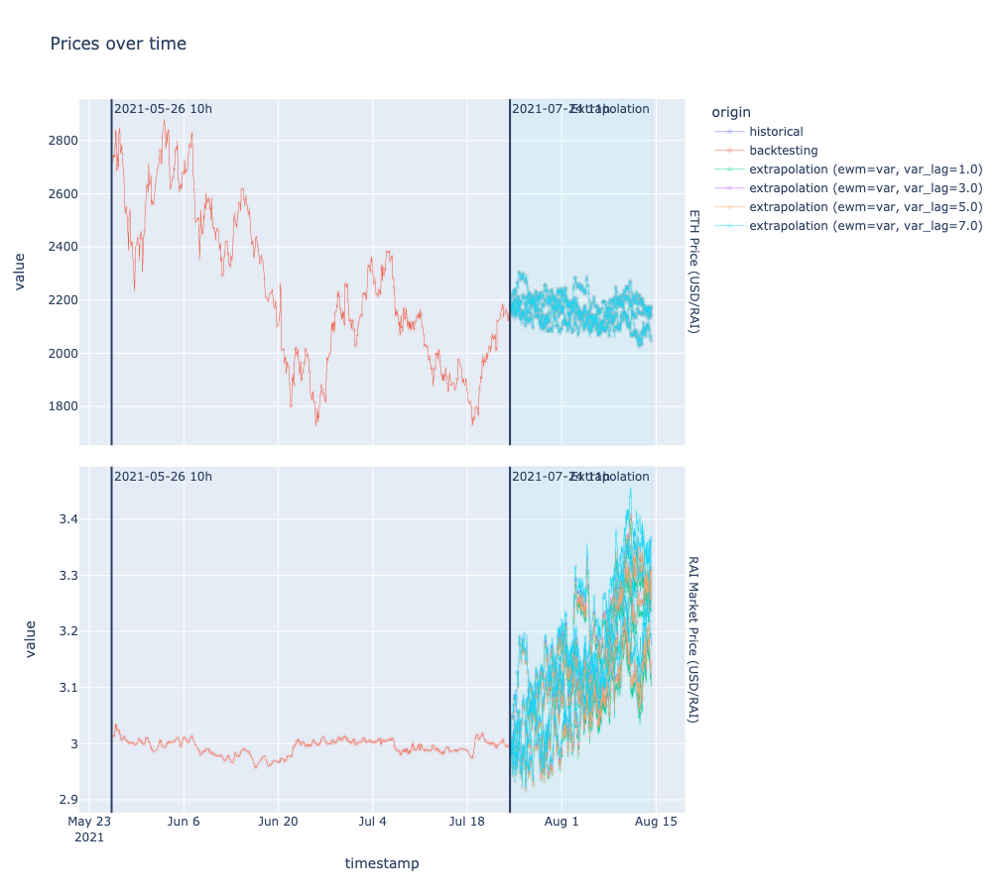

time: 1.1 s


In [592]:
value_cols = ('eth_price', 'market_price')
id_cols = {'timestamp', 'origin', 'subset'}
fig_df = (df.melt(id_vars=id_cols, value_vars=value_cols)
            .replace({'market_price': 'RAI Market Price (USD/RAI)'})
            .replace({'eth_price': 'ETH Price (USD/RAI)'})
         )
fig = px.line(fig_df,
              x='timestamp',
              y='value',
              color='origin',
              facet_row='variable',
              line_group='subset',
              labels={'market_price': 'RAI Market Price in USD'},
              height=900,
              width=900,
              title='Prices over time')
fig.update_traces(line=dict(width=0.5), 
                  marker=dict(opacity=0.05, size=5),
                  mode='lines+markers')
fig.add_vline(initial_time.timestamp() * 1000,
              annotation_text=initial_time.strftime('%Y-%m-%d %Hh'))
fig.add_vline(last_time.timestamp() * 1000,
              annotation_text=last_time.strftime('%Y-%m-%d %Hh'))
fig.add_vrect(x0=last_time, 
              x1=fig_df.timestamp.max(), 
              annotation_text="Extrapolation", 
              annotation_position="top right",
              fillcolor="cyan", 
              opacity=0.05)
fig.update_yaxes(matches=None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

In the plots above we evaluate the Eth price data (upper) and the Rai market price data (lower) showing the historical data and the forward extrapolation under various assumptions [Exponential Moving Average (EWM)](https://hackmd.io/3I-mwrs8QlOxnzBsezi5wA?both) and [optimal swap assumptions](https://hackmd.io/@bsci-rai/r1sT9Ma5d). The CSI number indicating the maximum intensity of the 'optimal swap'.

### Controller State

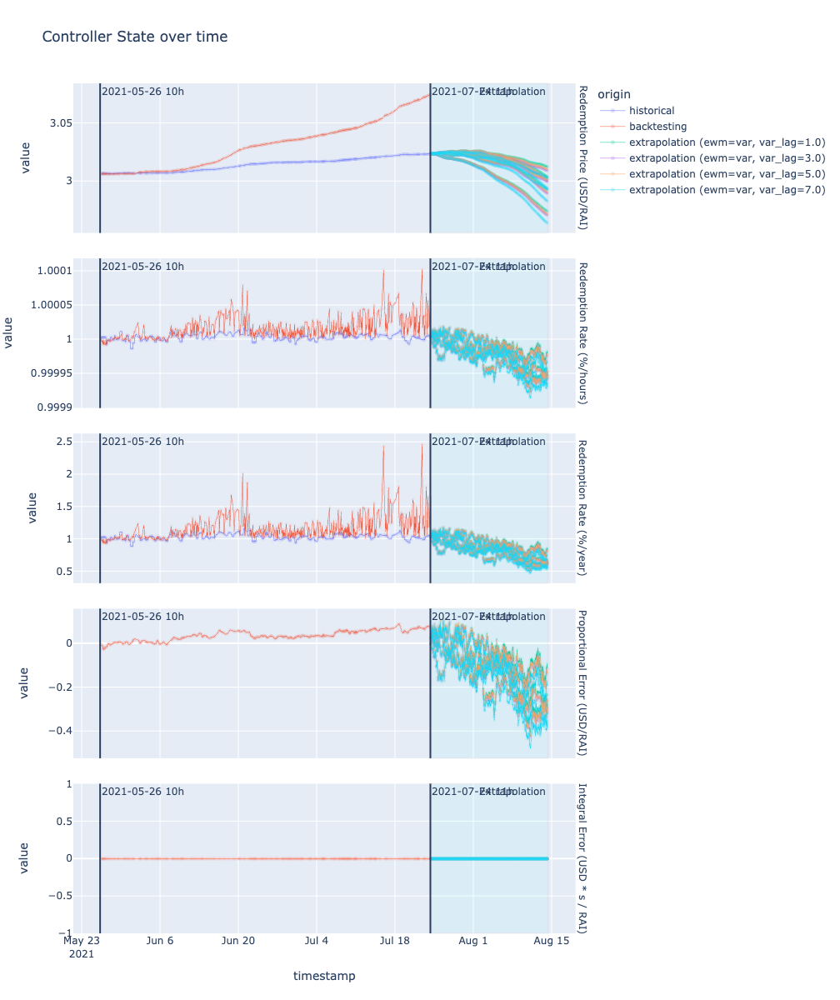

time: 2.98 s


In [593]:
value_cols = ('redemption_price', 
              'redemption_rate', 
              'redemption_rate_annual',
              'proportional_error',
              'integral_error')
id_cols = {'timestamp', 'origin', 'subset'}

fig_df = (df.assign(redemption_rate_annual=lambda df: df.redemption_rate ** (24 * 365))
            .melt(id_vars=id_cols, value_vars=value_cols)
            .replace({'redemption_price': 'Redemption Price (USD/RAI)'})
            .replace({'redemption_rate': 'Redemption Rate (%/hours)'})
            .replace({'redemption_rate_annual': 'Redemption Rate (%/year)'})
            .replace({'proportional_error': 'Proportional Error (USD/RAI)'})
            .replace({'integral_error': 'Integral Error (USD * s / RAI)'})
         )
fig = px.line(fig_df,
              x='timestamp',
              y='value',
              color='origin',
              facet_row='variable',
              line_group='subset',
              height=1200,
              title='Controller State over time')
fig.update_traces(line=dict(width=0.5), 
                  marker=dict(opacity=0.05, size=5),
                  mode='lines+markers')
fig.add_vline(initial_time.timestamp() * 1000,
              annotation_text=initial_time.strftime('%Y-%m-%d %Hh'))
fig.add_vline(last_time.timestamp() * 1000,
              annotation_text=last_time.strftime('%Y-%m-%d %Hh'))
fig.add_vrect(x0=last_time, 
              x1=fig_df.timestamp.max(), 
              annotation_text="Extrapolation", 
              annotation_position="top right",
              fillcolor="cyan", 
              opacity=0.05)
fig.update_yaxes(matches=None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

In the plots above we evaluate the controller states, in descending order(i.e. first state is the first plot)  of redemption_price, redemption_rate, redemption_rate_annual,proportional_error, and integral_error. The plots show the historical data and the forward extrapolation under various assumptions [Exponential Moving Average (EWM)](https://hackmd.io/3I-mwrs8QlOxnzBsezi5wA?both) and [optimal swap assumptions](https://hackmd.io/@bsci-rai/r1sT9Ma5d). The CSI number indicating the maximum intensity of the 'optimal swap'.

### Token State

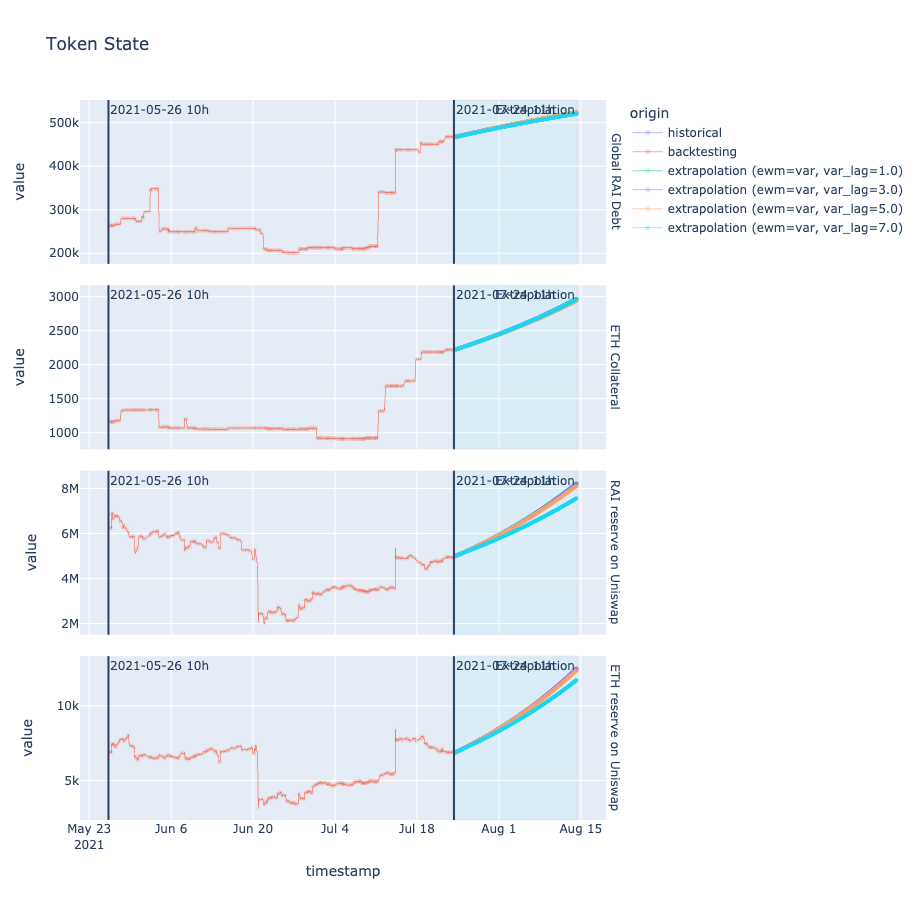

time: 2.27 s


In [594]:
value_cols = ('rai_debt', 'eth_locked', 'rai_reserve', 'eth_reserve')
id_cols = {'timestamp', 'origin', 'subset'}
fig_df = (df.melt(id_vars=id_cols, value_vars=value_cols)
            .replace({'rai_debt': 'Global RAI Debt'})
            .replace({'eth_locked': 'ETH Collateral'})
            .replace({'rai_reserve': 'RAI reserve on Uniswap'})
            .replace({'eth_reserve': 'ETH reserve on Uniswap'})
         )
fig = px.line(fig_df,
              x='timestamp',
              y='value',
              color='origin',
              facet_row='variable',
              line_group='subset',
              labels={'market_price': 'RAI Market Price in USD'},
              height=900,
              title='Token State')
fig.update_traces(line=dict(width=0.5), 
                  marker=dict(opacity=0.05, size=5),
                  mode='lines+markers')
fig.add_vline(initial_time.timestamp() * 1000,
              annotation_text=initial_time.strftime('%Y-%m-%d %Hh'))
fig.add_vline(last_time.timestamp() * 1000,
              annotation_text=last_time.strftime('%Y-%m-%d %Hh'))
fig.add_vrect(x0=last_time, 
              x1=fig_df.timestamp.max(), 
              annotation_text="Extrapolation", 
              annotation_position="top right",
              fillcolor="cyan", 
              opacity=0.05)
fig.update_yaxes(matches=None)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.show()

In the plots above we evaluate the token states, in descending order(i.e. first state is the first plot), of: rai_debt, eth_locked, rai_reserve, and eth_reserve. The plots show the historical data and the forward extrapolation under various assumptions [Exponential Moving Average (EWM)](https://hackmd.io/3I-mwrs8QlOxnzBsezi5wA?both) and [optimal swap assumptions](https://hackmd.io/@bsci-rai/r1sT9Ma5d). The CSI number indicating the maximum intensity of the 'optimal swap'.

## Conclusion

In this report, we've shown the real historical data that flow into the DT, and then extrapolations for the potential values of these states.